### Finding example comparison figures `Cellstitch` vs. `Cellpose+IoU`

In [1]:
import os
import sys
import h5py
import napari
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches

from skimage.color import label2rgb

from cellpose import utils as cp_utils
from cellpose import plot as cp_plot
from cellpose import models as cp_models

from cellstitch.pipeline import full_stitch
from cellstitch import utils as ct_utils
from cellstitch import evaluation


In [2]:
import matplotlib.font_manager
from matplotlib import rcParams

font_list = []
fpaths = matplotlib.font_manager.findSystemFonts()
for i in fpaths:
    try:
        f = matplotlib.font_manager.get_font(i)
        font_list.append(f.family_name)
    except RuntimeError:
        pass

font_list = set(font_list)
plot_font = 'Helvetica' if 'Helvetica' in font_list else 'FreeSans'

rcParams['font.family'] = plot_font
rcParams.update({'font.size': 15})

In [4]:
cp_model = cp_models.Cellpose(gpu=True, model_type='cyto2')

### Load data

In [57]:
%ls results/ovules/pipeline/ovules_subsampled/

cellpose3d/     cellstitch/     plantseg/
cellpose3d.csv  cellstitch.csv  plantseg.csv


In [3]:
img_path = 'data/ovules/frames/'
mask_path = 'data/ovules/masks/'

# raw & subsampled images
res_path = 'results/ovules/pipeline/'
ct_path = os.path.join(res_path, 'ovules/cellstitch/')
cp_path = os.path.join(res_path, 'ovules/cellpose3d/')
ps_path = os.path.join(res_path, 'ovules/plantseg/')


ct_ss_path = os.path.join(res_path, 'ovules_subsampled/cellstitch/')
cp_ss_path = os.path.join(res_path, 'ovules_subsampled/cellpose3d/')
ps_ss_path = os.path.join(res_path, 'ovules_subsampled/plantseg')

filenames = [
    f for f in sorted(os.listdir(ct_path))
    if f[-3:] == 'npy'
]


In [8]:
filenames

['N_294_final_crop_ds2.npy',
 'N_435_final_crop_ds2.npy',
 'N_441_final_crop_ds2.npy',
 'N_511_final_crop_ds2.npy',
 'N_522_final_crop_ds2.npy',
 'N_590_final_crop_ds2.npy',
 'N_593_final_crop_ds2.npy']

Comparison between `CellStitch`, `Cellpose 3D` & `Plantseg`

In [5]:
filename = filenames[-1]

# original image
img = np.load(os.path.join(img_path, filename))
mask = np.load(os.path.join(mask_path, filename)).astype(np.uint32)
mask_ct  = np.load(os.path.join(ct_path, filename)).astype(np.uint32)
mask_cp = np.load(os.path.join(cp_path, filename)).astype(np.uint32)
mask_ps = np.load(os.path.join(ps_path, filename)).astype(np.uint32)

# subsampled image
ss_filename = filenames[3]
mask_ct_ss = np.load(os.path.join(ct_ss_path, ss_filename)).astype(np.uint32)
mask_cp_ss = np.load(os.path.join(cp_ss_path, ss_filename)).astype(np.uint32)
mask_ps_ss = np.load(os.path.join(ps_ss_path, ss_filename)).astype(np.uint32)

In [42]:
def _mask_to_rgb(mask):
    n_lbls = evaluation.get_num_cells(mask)
    colors = np.random.random((n_lbls, 3))
    rgb = label2rgb(mask, colors=colors, bg_label=0)
    return rgb


def disp_adj_slices(img, 
                    mask, 
                    cp_pred, 
                    ps_pred,
                    ct_pred, 
                    idx,
                    show_title=False,
                    figsize=(25, 16)
                   ):
    """
    Juxtapose example slice i-1, i, i+1 between Ground-truth, Cellpose+IoU & CellStitch
    """
    assert img.shape == mask.shape == cp_pred.shape == ct_pred.shape, 'Inconsistent shapes'
    assert 0 < idx < img.shape[0]-1, 'Invalid subsampling idx'
    
    imgi, maski, cp_predi, ps_predi, ct_predi = img[idx-1:idx+2], mask[idx-1:idx+2], cp_pred[idx-1:idx+2], ps_pred[idx-1:idx+2], ct_pred[idx-1:idx+2]
    maski, cp_predi, ps_predi, ct_predi = _mask_to_rgb(maski), _mask_to_rgb(cp_predi), _mask_to_rgb(ps_predi), _mask_to_rgb(ct_predi)
    
    fig, axes = plt.subplots(3, 5, figsize=figsize, dpi=300)
    for row in range(3):
        axes[row, 0].imshow(imgi[row])
        #axes[row, 0].axis('off')
        axes[row, 0].set_xticks([])
        axes[row, 0].set_yticks([])
        
        if row == 0 and show_title:
            axes[row, 0].set_title('Raw Image', fontsize=32)
        
        axes[row, 1].imshow(maski[row])
        axes[row, 1].set_xticks([])
        axes[row, 1].set_yticks([])
        
        if row == 0 and show_title:
            axes[row, 1].set_title('Ground-truth', fontsize=32)
            
        axes[row, 2].imshow(ps_predi[row])
        axes[row, 2].set_xticks([])
        axes[row, 2].set_yticks([])
        
        if row == 0 and show_title:
            axes[row, 2].set_title('PlantSeg', fontsize=32)
        
        axes[row, 3].imshow(cp_predi[row])
        axes[row, 3].set_xticks([])
        axes[row, 3].set_yticks([])
        
        if row == 0 and show_title:
            axes[row, 3].set_title('Cellpose 3D', fontsize=32)  
            
        axes[row, 4].imshow(ct_predi[row])
        axes[row, 4].set_xticks([])
        axes[row, 4].set_yticks([])
        
        if row == 0 and show_title:
            axes[row, 4].set_title('CellStitch', fontsize=32)  
         
    row_lbls = [r'Layer $i-1$', r'Layer $i$', r'Layer $i+1$']
    for ax, row in zip(axes[:,0], row_lbls):
        ax.set_ylabel(row, rotation=0, size=28)
        ax.yaxis.set_label_coords(-0.3, 0.5)
            
    fig.tight_layout()
    return fig, axes
    

In [79]:
import matplotlib.patches as patches

In [127]:
# Visualize with napari viewer
# raw image:
viewer = napari.Viewer()
viewer.add_image(img)
viewer.add_labels(mask, name="Ground truth")
viewer.add_labels(mask_cp, name="Cellpose3D")
viewer.add_labels(mask_ps, name="PlantSeg")
viewer.add_labels(mask_ct, name="CellStitch")


<Labels layer 'CellStitch' at 0x7efbfa170880>

In [124]:
# Visualize with napari viewer
# subsampled image:
viewer = napari.Viewer()
viewer.add_image(img_ss)
viewer.add_labels(mask_ss, name="Ground truth")
viewer.add_labels(mask_cp_ss, name="Cellpose3D")
viewer.add_labels(mask_ps_ss, name="PlantSeg")
viewer.add_labels(mask_ct_ss, name="CellStitch")


<Labels layer 'CellStitch' at 0x7efcfd714040>

In [39]:
ss_idx = np.arange(0, 388, 2)
img_ss = img[ss_idx]
mask_ss = mask[ss_idx]

# Set background label as 0 for displaying consistency
if mask_ps.min() != 0:
    mask_ps -= mask_ps.min() 
if mask_ps_ss.min() != 0:
    mask_ps_ss -= mask_ps_ss.min()
    

Text(0.5, 1.03, 'Ovules (Low Anisotropy)')

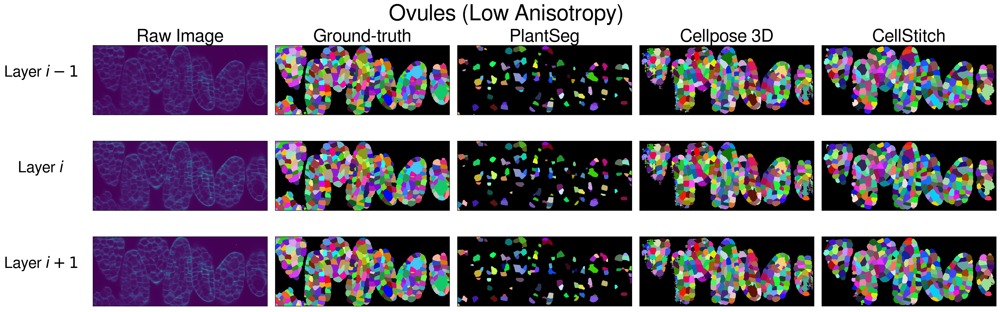

In [43]:
fig, axes = disp_adj_slices(img, 
                            mask, 
                            mask_cp, 
                            mask_ps, 
                            mask_ct, 
                            idx=75, 
                            figsize=(25, 8),
                            show_title=True
                           )

fig.suptitle('Ovules (Low Anisotropy)', y=1.03, fontsize=40)

In [44]:
fig.savefig('figures/cellstitch_example.png', dpi=300, bbox_inches = "tight")

Text(0.5, 1.02, 'Ovules (High Anisotropy)')

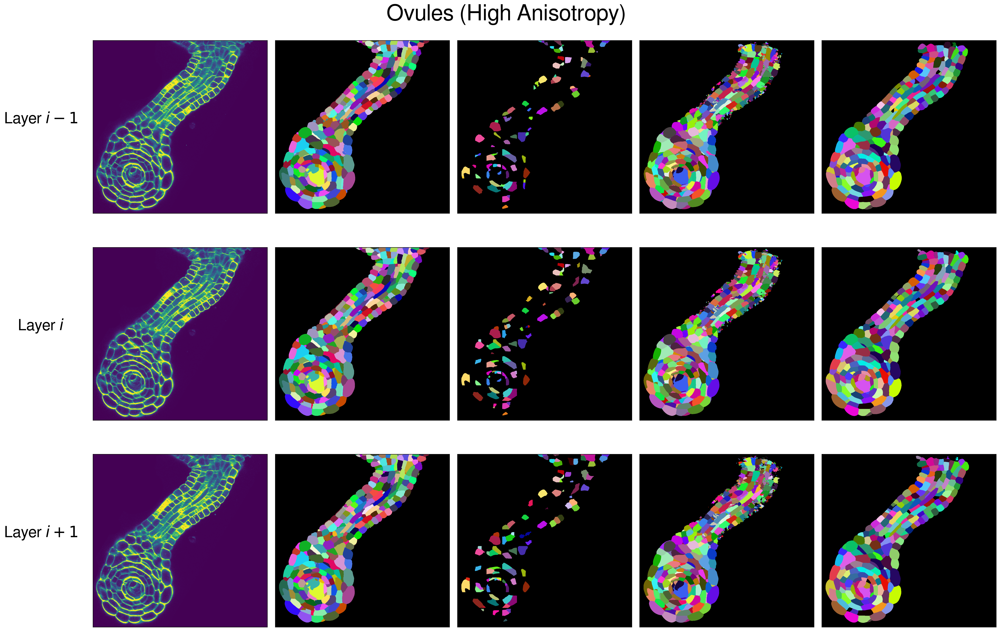

In [45]:
fig, axes = disp_adj_slices(img_ss, 
                            mask_ss, 
                            mask_cp_ss, 
                            mask_ps_ss, 
                            mask_ct_ss, 
                            idx=96)

fig.suptitle('Ovules (High Anisotropy)', y=1.02, fontsize=40)

In [46]:
# Add highlight box
bound = patches.Rectangle((600, 10), 300, 400, linewidth=3, edgecolor='lightyellow', facecolor='none')
for row in range(3):
    for col in range(1, 5):
        bound = patches.Rectangle((600, 10), 300, 400, linewidth=2, edgecolor='lightyellow', facecolor='none')
        axes[row][col].add_patch(bound)
        
fig.savefig('figures/cellstitch_ss_example.png', bbox_inches = "tight", dpi=300)